[![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/adieulev/Certificate-DS-2024/blob/main/Labs/Lab-CP-tuto/TP_cp_classif.ipynb)

# Conformal prediction for classification purpose
Inspired by the tutorial of Angelopoulos

In [37]:
import requests

exec(requests.get("https://raw.githubusercontent.com/adieulev/Certificate-DS-2025/refs/heads/main/Labs/get-send-code.html").content)

npt_config = {
    'session_name': 'TutoCP',
    'session_owner': 'aymeric',
    'sender_name': input("Your name:"),
}
send('started', 0)



Your name:aymeric


<Response [200]>

In [2]:
import os
import json
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.image import imread
!pip install -U --no-cache-dir gdown --pre

## Data preparation

### Load the data

In this cell, we prepare all necessary data for model evaluation, visualization, or analysis based on the ImageNet dataset and ResNet-152 predictions.

- Check if the ../data directory exists; if not, it downloads a .tar.gz archive using gdown, extracts it, and removes the archive.

- Ensure the human-readable ImageNet labels JSON file is present; if missing, it downloads it via wget.

- Load precomputed softmax outputs (smx) and corresponding label indices (labels) from a .npz file.

- Convert the labels to integers for further processing or evaluation.

- Read the list of example image file paths from the ../data/imagenet/examples directory.


In [3]:
# Check if the '../data' directory exists
if not os.path.exists('../data'):
    # If not, download the data archive from Google Drive using gdown
    os.system('gdown 1h7S6N_Rx7gdfO3ZunzErZy6H7620EbZK -O ../data.tar.gz')
    # Extract the contents of the tar.gz archive to the parent directory
    os.system('tar -xf ../data.tar.gz -C ../')
    # Remove the archive file after extraction
    os.system('rm ../data.tar.gz')

# Check if the human-readable ImageNet labels JSON file exists
if not os.path.exists('../data/imagenet/human_readable_labels.json'):
    # If not, download it from the specified GitHub URL using wget
    !wget -nv -O ../data/imagenet/human_readable_labels.json -L https://raw.githubusercontent.com/anishathalye/imagenet-simple-labels/master/imagenet-simple-labels.json

# Load the precomputed softmax outputs and labels from a NumPy .npz file
data = np.load('../data/imagenet/imagenet-resnet152.npz')

# Get a list of file names in the 'examples' directory
example_paths = os.listdir('../data/imagenet/examples')

# Extract the softmax predictions from the loaded data
smx = data['smx']

# Convert the loaded label data to integers
labels = data['labels'].astype(int)


In [8]:
smx.shape, labels.shape

((50000, 1000), (50000,))

### Setting parameters for conformal prediction

In [4]:
# Problem setup
n_cal = 1000    # number of calibration points
alpha = 0.1     # 1-alpha is the desired coverage

### Splitting the data

In [5]:
# Split the softmax scores into calibration and validation sets (save the shuffling)

idx = np.array([1] * n_cal + [0] * (smx.shape[0]-n_cal)) > 0
np.random.seed(42)
np.random.shuffle(idx)

cal_smx, test_smx = smx[idx,:], smx[~idx,:]
cal_labels, test_labels = labels[idx], labels[~idx]

### Understanding what is stored in the data

The first 10 labels in the calibration set are  [0 0 1 3 5 6 6 6 7 9]
The minimal label is  0
The maximal label is  999


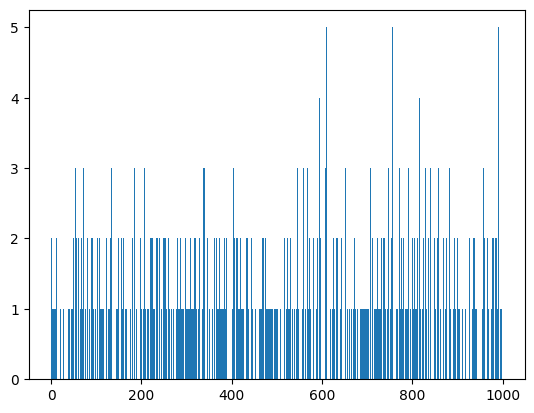

In [14]:
# Zoom on the labels in the calibration set
print("The first 10 labels in the calibration set are ", cal_labels[:10])
print("The minimal label is ", np.min(cal_labels))
print("The maximal label is ", np.max(cal_labels))
plt.hist(cal_labels, bins=1000);

The first 10 labels in the test set are  [0 0 0 0 0 0 0 0 0 0]
The minimal label is  0
The maximal label is  999


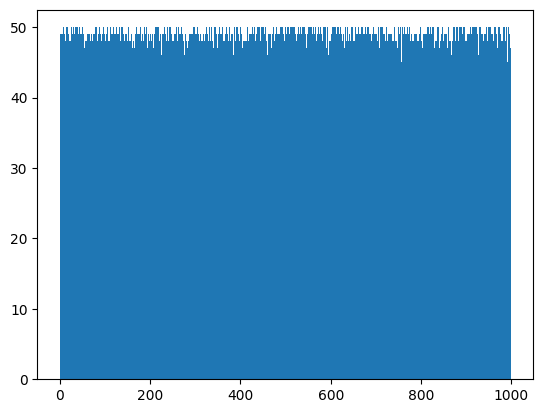

In [15]:
# Zoom on the labels in the test set
print("The first 10 labels in the test set are ", test_labels[:10])
print("The minimal label is ",np.min(test_labels))
print("The maximal label is ",np.max(test_labels))
plt.hist(test_labels,bins=1000);

In [16]:
print("The total number of different labels in the dataset:",len(np.unique(labels)))

The total number of different labels in the dataset: 1000


The sum of a row of cal_smx gives  0.9999999642681061


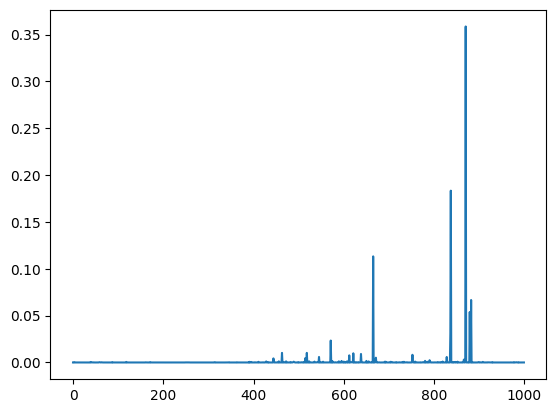

In [17]:
# Look at a row of cal_smx: this corresponds to the predicted probabilities
# (the training has been already performed)
plt.plot(cal_smx[450])
print("The sum of a row of cal_smx gives ",np.sum(cal_smx[450]))

### A first way for conformal prediction

In this section, we implement the first strategy:

![Solution Image](https://raw.githubusercontent.com/adieulev/Certificate-DS-2025/main/Labs/Lab-CP-tuto/tutosol1.png)



To that end:

<div class="alert alert-block alert-info">
    1. For each calibration point, compute a score. <br>
    2. And then evaluate an empirical quantile of the calibration scores.  
</div>



In [55]:
# 1: get conformal scores
cal_scores = 1-cal_smx[np.arange(n_cal),cal_labels]             # TODO OPERAND


# 2: get adjusted quantile
q_level = np.ceil((n_cal+1)*(1-alpha))/n_cal                    # TODO OPERAND
qhat = np.quantile(cal_scores, q_level, interpolation='higher') # TODO OPERAND


In [56]:
cal_scores[1:10]

array([3.40580940e-04, 6.41055703e-02, 9.99865802e-01, 5.47298789e-02,
       2.35717893e-02, 6.09320402e-03, 3.33090365e-01, 6.46929324e-01,
       1.33633614e-04])

<div class="alert alert-block alert-info">
    3. Form the prediction sets for the test set
</div>

In [57]:
# 3: form prediction sets
prediction_sets = test_smx >= (1-qhat) # 3: form prediction sets

In [58]:
prediction_sets.shape

(49000, 1000)

<div class="alert alert-block alert-info">
    4. Compute the empirical coverage
</div>

In [59]:
# Calculate empirical coverage
empirical_coverage = prediction_sets[np.arange(prediction_sets.shape[0]),test_labels].mean() #TODO OPERAND
print(f"The empirical coverage is: {empirical_coverage}")

empirical_average_set_size = prediction_sets.sum(axis=1).mean()
print(f"The empirical average set size is: {empirical_average_set_size}")

send(["The empirical coverage is:", empirical_coverage], 21)

The empirical coverage is: 0.894469387755102
The empirical average set size is: 1.6902244897959184


<Response [200]>

<div class="alert alert-block alert-info">
    5. Illustrate prediction sets for some points of the test set
</div>

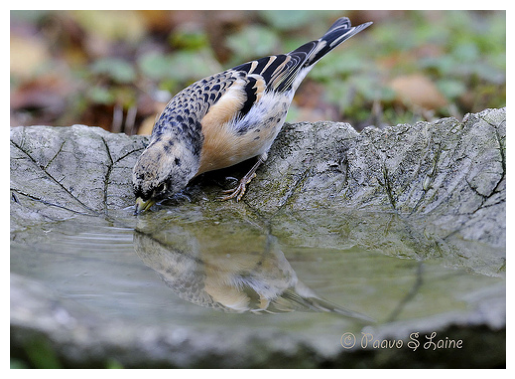

The prediction set is: [np.str_('brambling')]


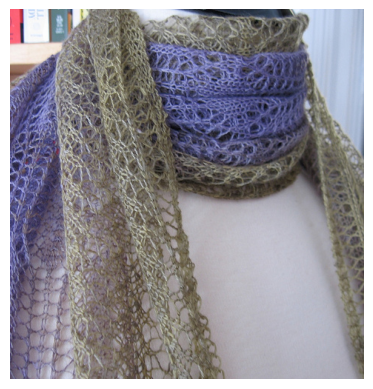

The prediction set is: [np.str_('scarf')]


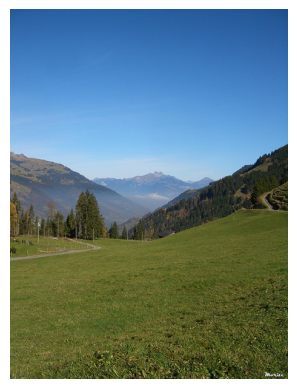

The prediction set is: [np.str_('alp'), np.str_('valley')]


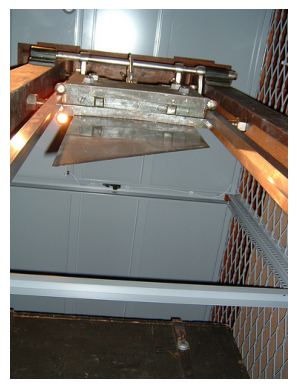

The prediction set is: [np.str_('dishwasher'), np.str_('photocopier'), np.str_('printer')]


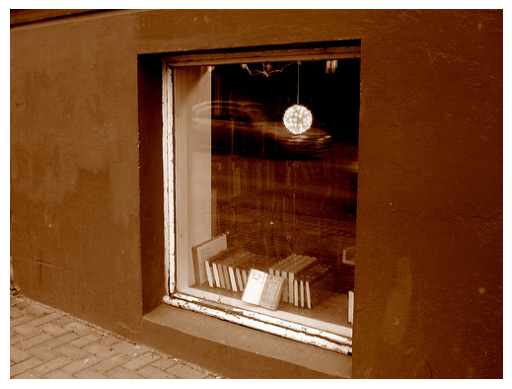

The prediction set is: [np.str_('barbershop'), np.str_('bookstore'), np.str_('prison'), np.str_('safe'), np.str_('window shade')]


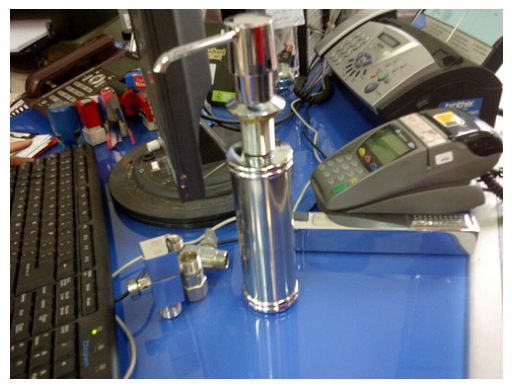

The prediction set is: [np.str_('joystick'), np.str_('weighing scale'), np.str_('soap dispenser')]


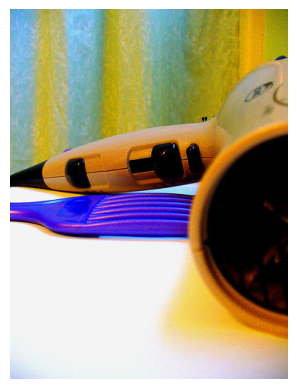

The prediction set is: [np.str_('hair dryer')]


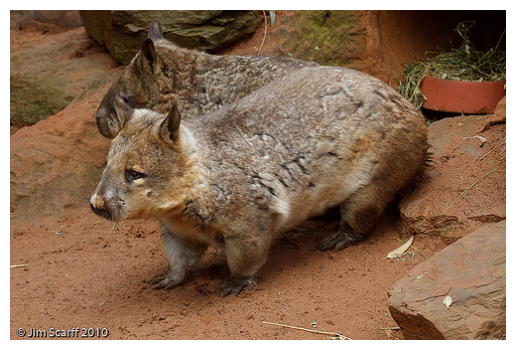

The prediction set is: [np.str_('wombat')]


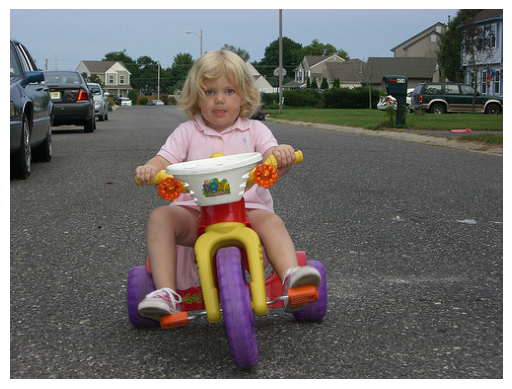

The prediction set is: [np.str_('tricycle')]


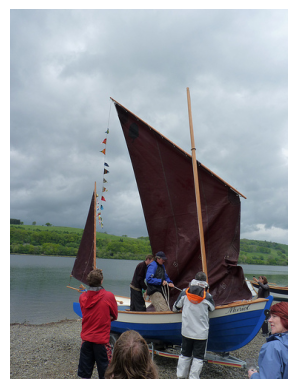

The prediction set is: [np.str_('schooner'), np.str_('yawl')]


In [60]:
# Making the labels human-readable
with open('../data/imagenet/human_readable_labels.json') as f:
    label_strings = np.array(json.load(f))

# Show some examples
example_paths =os.listdir('../data/imagenet/examples')
for i in range(10):
    rand_path = np.random.choice(example_paths)
    img = imread('../data/imagenet/examples/' + rand_path )
    img_index = int(rand_path.split('.')[0])
    #
    prediction_set = smx[img_index] > 1-qhat #TODO OPERAND
    #
    plt.figure()
    plt.imshow(img)
    plt.axis('off')
    send(plt, 22)
    plt.show()
    print(f"The prediction set is: {list(label_strings[prediction_set])}")

<div class="alert alert-block alert-success">This method leads to <b>small prediction sets</b>, but sacrifices <b>adaptivity</b>. </div>



## Towards more adaptive prediction sets

In this section, we are interested in the second solution:

![Solution Image](https://raw.githubusercontent.com/adieulev/Certificate-DS-2025/main/Labs/Lab-CP-tuto/tutosol2.png)


<div class="alert alert-block alert-info">
    <ol>
<li>Sort in decreasing order $\hat{p}_{\sigma_i(1)}(X_i) \geq ... \geq  \hat{p}_{\sigma_i(C)}(X_i)$</li>
   

To that end:

<li> Compute the calibration scores $S_i = \sum_{k=1}^{\sigma_i^{-1}(Y_i)} \hat{p}_{\sigma_i(k)}(X_i)$ (sum of the estimated probabilities associated to classes at least as large as that of the true class $Y_i$)} </li>
    <li> Get the quantile $q_{1-\alpha}(\mathcal{S})$ </li>
<li> Return the classes $\sigma_{\text{new}}(1),... ,\sigma_{\text{new}}(r^\star)$ where $r^{\star} = \text{argmax}_{1 \leq r \leq C}\left\{ \sum_{k=1}^{r} \hat{p}_{\sigma_{\text{new}}(k)}(X_{\text{new}}) < q_{1-\alpha}(\mathcal{S}) \right\} + 1$</li>
         </ol>

NB : to avoid the +1, you can use the corrected quantile ;)

In [71]:
# Get scores

# get for each row the position of the predicted probabilities in decreasing order

cal_pi = cal_smx.argsort(1)[:,::-1] #TODO OPERAND
#argsort in increasing order, so order reverting by [:,::-1]

# form for each row the predicted probabilities in decreasing order
cal_srt = np.take_along_axis(cal_smx,cal_pi,axis=1) #TODO OPERAND

# get the rank of the true label in the sorted predicted probabilities
cal_L = np.where(cal_pi == cal_labels[:,None])[1] #TODO OPERAND

# compute the calibration scores (why minus something????)
cal_scores = cal_srt.cumsum(axis=1)[np.arange(n_cal),cal_L] #TODO OPERAND

# Get the score quantile
qhat = np.quantile(cal_scores, np.ceil((n_cal+1)*(1-alpha))/n_cal, interpolation='higher') #TODO OPERAND



In [72]:
# Deploy on the test set
n_test = test_smx.shape[0]


# sorting the predicted probabilities (softmax outputs) on the test set
test_pi = test_smx.argsort(1)[:,::-1] #TODO OPERAND


# reordering
test_srt = np.take_along_axis(test_smx,test_pi,axis=1) #TODO OPERAND


#test_srt_cumsum = test_srt.cumsum(axis=1)
# cumulative softmax outputs
indicators = test_srt.cumsum(axis=1) <= qhat #TODO OPERAND
prediction_sets = np.take_along_axis(indicators,test_pi.argsort(axis=1),axis=1) #TODO OPERAND


In [73]:
# Calculate empirical coverage

empirical_coverage = prediction_sets[np.arange(n_test),test_labels].mean() #TODO OPERAND
print(f"The empirical coverage is: {empirical_coverage}")

empirical_average_set_size = prediction_sets.sum(axis=1).mean()
print(f"The empirical average set size is: {empirical_average_set_size}")

print(f"The quantile is: {qhat}")
send(["The empirical coverage is:", empirical_coverage], 23)

The empirical coverage is: 0.8972857142857142
The empirical average set size is: 209.0902448979592
The quantile is: 0.9998968839645386


<Response [200]>

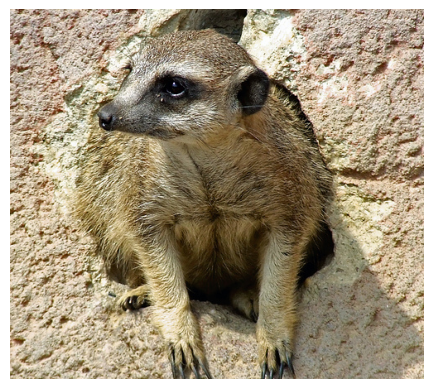

The prediction set is: [np.str_('wallaby'), np.str_('mongoose'), np.str_('meerkat'), np.str_('marmot'), np.str_('badger'), np.str_('ring-tailed lemur')]


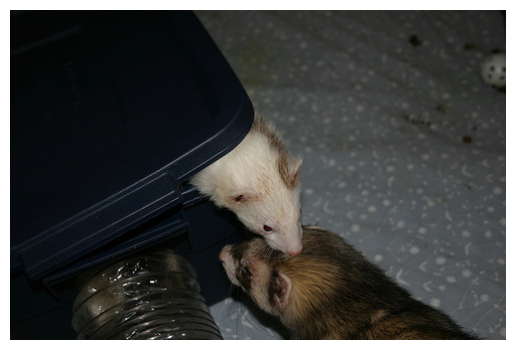

The prediction set is: [np.str_('weasel'), np.str_('mink'), np.str_('European polecat'), np.str_('black-footed ferret'), np.str_('skunk'), np.str_('badger'), np.str_('mousetrap')]


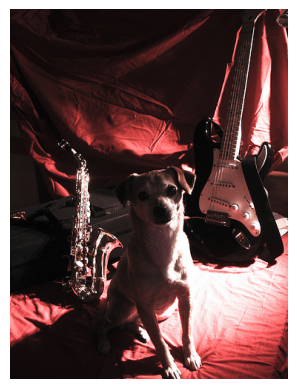

The prediction set is: [np.str_('great white shark'), np.str_('tiger shark'), np.str_('cock'), np.str_('bulbul'), np.str_('jay'), np.str_('spotted salamander'), np.str_('tree frog'), np.str_('Gila monster'), np.str_('triceratops'), np.str_('eastern hog-nosed snake'), np.str_('night snake'), np.str_('Indian cobra'), np.str_('eastern diamondback rattlesnake'), np.str_('scorpion'), np.str_('tick'), np.str_('peacock'), np.str_('grey parrot'), np.str_('hummingbird'), np.str_('wallaby'), np.str_('koala'), np.str_('jellyfish'), np.str_('conch'), np.str_('slug'), np.str_('spiny lobster'), np.str_('crayfish'), np.str_('king penguin'), np.str_('sea lion'), np.str_('Chihuahua'), np.str_('Japanese Chin'), np.str_('Maltese'), np.str_('Pekingese'), np.str_('Shih Tzu'), np.str_('King Charles Spaniel'), np.str_('Papillon'), np.str_('toy terrier'), np.str_('Rhodesian Ridgeback'), np.str_('Afghan Hound'), np.str_('Basset Hound'), np.str_('Beagle'), np.str_('Bloodhound'), np.str_('Bluetick Coonhound'), n

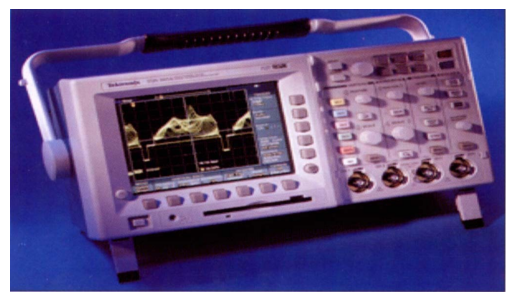

The prediction set is: [np.str_('starfish'), np.str_('abacus'), np.str_('analog clock'), np.str_('automated teller machine'), np.str_('cassette'), np.str_('cassette player'), np.str_('CD player'), np.str_('computer keyboard'), np.str_('desk'), np.str_('desktop computer'), np.str_('rotary dial telephone'), np.str_('digital clock'), np.str_('digital watch'), np.str_('electric guitar'), np.str_('entertainment center'), np.str_('hand-held computer'), np.str_('hard disk drive'), np.str_('iPod'), np.str_('joystick'), np.str_('laptop computer'), np.str_('speaker'), np.str_('microwave oven'), np.str_('modem'), np.str_('monitor'), np.str_('computer mouse'), np.str_('notebook computer'), np.str_('oscilloscope'), np.str_('pencil case'), np.str_('Petri dish'), np.str_('photocopier'), np.str_('printer'), np.str_('radio'), np.str_('remote control'), np.str_('rotisserie'), np.str_('ruler'), np.str_('weighing scale'), np.str_('scoreboard'), np.str_('CRT screen'), np.str_('sewing machine'), np.str_('sl

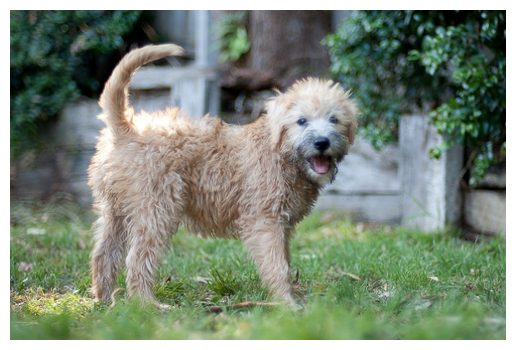

The prediction set is: [np.str_('house finch'), np.str_('green iguana'), np.str_('European garden spider'), np.str_('conch'), np.str_('crane (bird)'), np.str_('Maltese'), np.str_('Shih Tzu'), np.str_('Rhodesian Ridgeback'), np.str_('Afghan Hound'), np.str_('Bloodhound'), np.str_('English foxhound'), np.str_('Redbone Coonhound'), np.str_('Irish Wolfhound'), np.str_('Whippet'), np.str_('Ibizan Hound'), np.str_('Otterhound'), np.str_('Scottish Deerhound'), np.str_('Staffordshire Bull Terrier'), np.str_('American Staffordshire Terrier'), np.str_('Bedlington Terrier'), np.str_('Border Terrier'), np.str_('Kerry Blue Terrier'), np.str_('Irish Terrier'), np.str_('Norfolk Terrier'), np.str_('Norwich Terrier'), np.str_('Yorkshire Terrier'), np.str_('Wire Fox Terrier'), np.str_('Lakeland Terrier'), np.str_('Sealyham Terrier'), np.str_('Airedale Terrier'), np.str_('Cairn Terrier'), np.str_('Australian Terrier'), np.str_('Dandie Dinmont Terrier'), np.str_('Miniature Schnauzer'), np.str_('Giant Schn

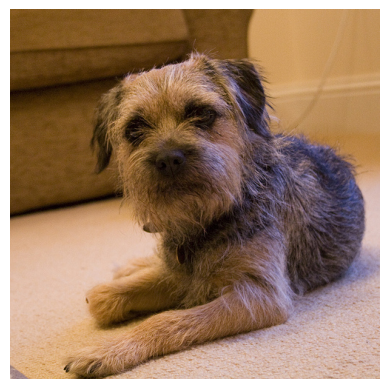

The prediction set is: [np.str_('Chihuahua'), np.str_('Maltese'), np.str_('Shih Tzu'), np.str_('toy terrier'), np.str_('Beagle'), np.str_('Bluetick Coonhound'), np.str_('Irish Wolfhound'), np.str_('Otterhound'), np.str_('Border Terrier'), np.str_('Irish Terrier'), np.str_('Norfolk Terrier'), np.str_('Norwich Terrier'), np.str_('Yorkshire Terrier'), np.str_('Wire Fox Terrier'), np.str_('Lakeland Terrier'), np.str_('Airedale Terrier'), np.str_('Cairn Terrier'), np.str_('Australian Terrier'), np.str_('Dandie Dinmont Terrier'), np.str_('Miniature Schnauzer'), np.str_('Standard Schnauzer'), np.str_('Tibetan Terrier'), np.str_('Australian Silky Terrier'), np.str_('Soft-coated Wheaten Terrier'), np.str_('Lhasa Apso'), np.str_('Vizsla'), np.str_('Bullmastiff'), np.str_('Affenpinscher'), np.str_('Griffon Bruxellois'), np.str_('Toy Poodle'), np.str_('mongoose'), np.str_('meerkat'), np.str_('bath towel'), np.str_('carton'), np.str_('crate'), np.str_('doormat'), np.str_('dumbbell'), np.str_('lens 

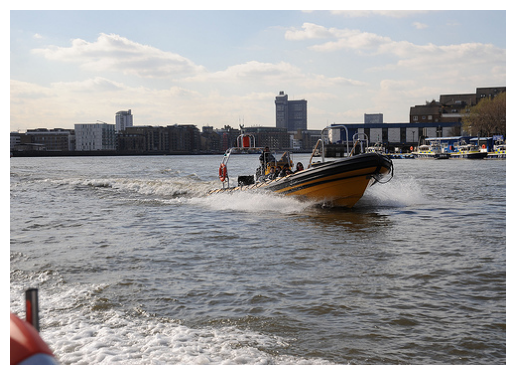

The prediction set is: [np.str_('amphibious vehicle'), np.str_('lifeboat'), np.str_('paddle'), np.str_('motorboat')]


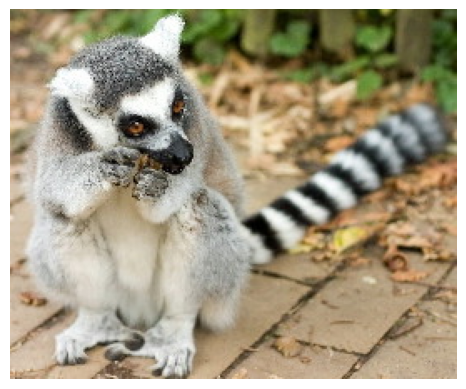

The prediction set is: [np.str_('ring-tailed lemur')]


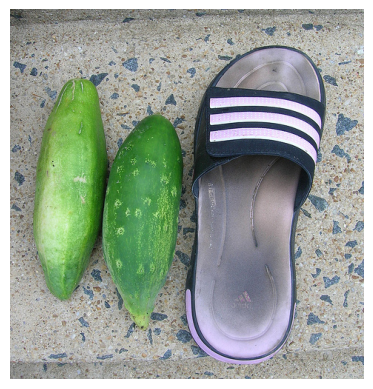

The prediction set is: [np.str_('tench'), np.str_('goldfish'), np.str_('tiger shark'), np.str_('electric ray'), np.str_('stingray'), np.str_('indigo bunting'), np.str_('spotted salamander'), np.str_('axolotl'), np.str_('American bullfrog'), np.str_('tree frog'), np.str_('leatherback sea turtle'), np.str_('mud turtle'), np.str_('terrapin'), np.str_('banded gecko'), np.str_('Carolina anole'), np.str_('European green lizard'), np.str_('Nile crocodile'), np.str_('American alligator'), np.str_('worm snake'), np.str_('ring-necked snake'), np.str_('smooth green snake'), np.str_('garter snake'), np.str_('water snake'), np.str_('vine snake'), np.str_('night snake'), np.str_('boa constrictor'), np.str_('African rock python'), np.str_('Indian cobra'), np.str_('green mamba'), np.str_('sea snake'), np.str_('Saharan horned viper'), np.str_('sidewinder'), np.str_('trilobite'), np.str_('tarantula'), np.str_('wolf spider'), np.str_('tick'), np.str_('centipede'), np.str_('grey parrot'), np.str_('macaw')

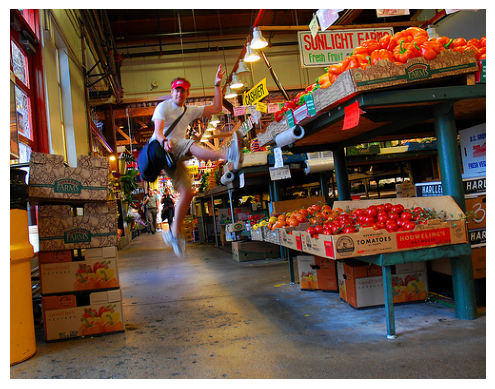

The prediction set is: [np.str_('goldfish'), np.str_('great white shark'), np.str_('hammerhead shark'), np.str_('stingray'), np.str_('cock'), np.str_('hen'), np.str_('house finch'), np.str_('indigo bunting'), np.str_('American robin'), np.str_('jay'), np.str_('magpie'), np.str_('American dipper'), np.str_('vulture'), np.str_('fire salamander'), np.str_('axolotl'), np.str_('tree frog'), np.str_('tailed frog'), np.str_('loggerhead sea turtle'), np.str_('leatherback sea turtle'), np.str_('terrapin'), np.str_('box turtle'), np.str_('green iguana'), np.str_('desert grassland whiptail lizard'), np.str_('agama'), np.str_('Gila monster'), np.str_('European green lizard'), np.str_('Komodo dragon'), np.str_('Nile crocodile'), np.str_('American alligator'), np.str_('triceratops'), np.str_('kingsnake'), np.str_('vine snake'), np.str_('night snake'), np.str_('boa constrictor'), np.str_('African rock python'), np.str_('Indian cobra'), np.str_('green mamba'), np.str_('eastern diamondback rattlesnake'

In [74]:
# Show some examples
with open('../data/imagenet/human_readable_labels.json') as f:
    label_strings = np.array(json.load(f))

example_paths =os.listdir('../data/imagenet/examples')
for i in range(10):
    rand_path = np.random.choice(example_paths)
    img = imread('../data/imagenet/examples/' + rand_path )
    img_index = int(rand_path.split('.')[0])
    # Form the prediction set


    _smx = smx[img_index]         #TODO OPERAND
    _pi = np.argsort(_smx)[::-1]  #TODO OPERAND
    _srt = np.take_along_axis(_smx,_pi,axis=0) #TODO OPERAND
    _srt_cumsum = _srt.cumsum()        #TODO OPERAND
    _ind = _srt_cumsum <= qhat  #TODO OPERAND

#     _smx = smx[img_index]         #TODO OPERAND
#     _pi = np.argsort(_smx)[::-1]  #TODO OPERAND
#     _srt = np.take_along_axis(_smx,_pi,axis=0) #TODO OPERAND
#     _srt_reg_cumsum = _srt_reg.cumsum()        #TODO OPERAND
#     _ind = (_srt_reg_cumsum - np.random.rand()*_srt_reg) <= qhat if rand else _srt_reg_cumsum - _srt_reg <= qhat #TODO OPERAND

    # if disallow_zero_sets: _ind[0] = True
    prediction_set = np.take_along_axis(_ind,_pi.argsort(),axis=0)
    plt.figure()
    plt.imshow(img)
    plt.axis('off')
    send(plt, 24)
    plt.show()
    print(f"The prediction set is: {list(label_strings[prediction_set])}")

## Another way for adaptive predictive sets in classification


[Sadinle, Lei, Wasserman] https://arxiv.org/abs/1609.00451


[Notebook source](https://github.com/aangelopoulos/conformal-prediction/blob/main/notebooks/imagenet-raps.ipynb)

In [65]:
# Set RAPS regularization parameters (larger lam_reg and smaller k_reg leads to smaller sets)
lam_reg = 0.01
k_reg = 5
disallow_zero_sets = False # Set this to False in order to see the coverage upper bound hold
rand = True # Set this to True in order to see the coverage upper bound hold
reg_vec = np.array(k_reg*[0,] + (smx.shape[1]-k_reg)*[lam_reg,])[None,:] # create a row with 5 zeroes and the rest at 0.01

In [66]:
# Get scores

# get for each row the position of the predicted probabilities in decreasing order
cal_pi = cal_smx.argsort(1)[:,::-1] #argsort in increasing order, so order reverting by [:,::-1]

# form for each row the predicted probabilities in decreasing order
cal_srt = np.take_along_axis(cal_smx,cal_pi,axis=1)

cal_srt_reg = cal_srt + reg_vec # addition row by row of 0 0 0 0 0 0.1 0.1 ....

# get the rank of the true label in the sorted predicted probabilities
cal_L = np.where(cal_pi == cal_labels[:,None])[1]

# compute the calibration scores (why minus something????)
cal_scores = cal_srt_reg.cumsum(axis=1)[np.arange(n_cal),cal_L] - np.random.rand(n_cal)*cal_srt_reg[np.arange(n_cal),cal_L]

# Get the score quantile
qhat = np.quantile(cal_scores, np.ceil((n_cal+1)*(1-alpha))/n_cal, interpolation='higher')


In [67]:
# Deploy
n_test = test_smx.shape[0]
test_pi = test_smx.argsort(1)[:,::-1] # sorting the predicted probabilities (softmax outputs) on the test set
test_srt = np.take_along_axis(test_smx,test_pi,axis=1) # reordering
test_srt_reg = test_srt + reg_vec # ???
test_srt_reg_cumsum = test_srt_reg.cumsum(axis=1) # cumulative softmax outputs
indicators = (test_srt_reg.cumsum(axis=1) - np.random.rand(n_test,1)*test_srt_reg) <= qhat if rand else test_srt_reg.cumsum(axis=1) - test_srt_reg <= qhat
if disallow_zero_sets: indicators[:,0] = True
prediction_sets = np.take_along_axis(indicators,test_pi.argsort(axis=1),axis=1)

In [70]:
# Calculate empirical coverage
empirical_coverage = prediction_sets[np.arange(n_test),test_labels].mean()
print(f"The empirical coverage is: {empirical_coverage}")

empirical_average_set_size = prediction_sets.sum(axis=1).mean()
print(f"The empirical average set size is: {empirical_average_set_size}")

print(f"The quantile is: {qhat}")

The empirical coverage is: 0.8911428571428571
The empirical average set size is: 2.8830408163265306
The quantile is: 0.9402584557325844


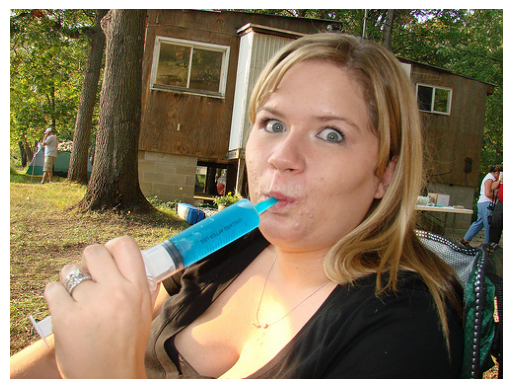

The prediction set is: [np.str_('syringe'), np.str_('ice pop')]


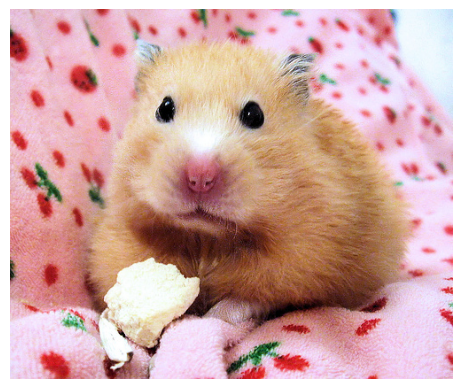

The prediction set is: [np.str_('hamster')]


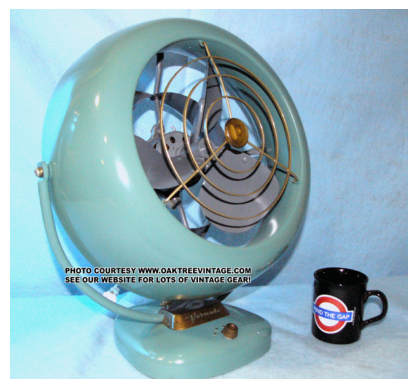

The prediction set is: [np.str_('electric fan'), np.str_('hair dryer'), np.str_('stove')]


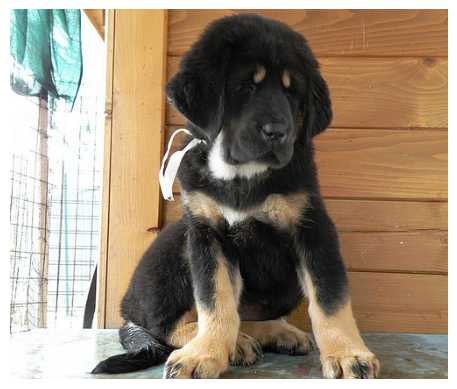

The prediction set is: [np.str_('Tibetan Mastiff')]


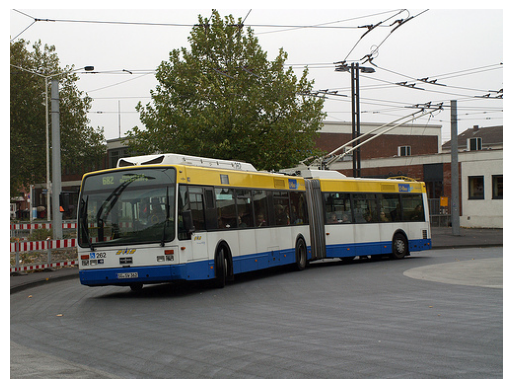

The prediction set is: [np.str_('trolleybus')]


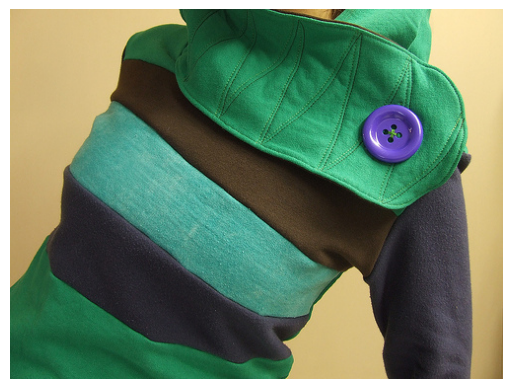

The prediction set is: [np.str_('backpack'), np.str_('cardigan'), np.str_('diaper'), np.str_('mail bag'), np.str_('poncho'), np.str_('purse'), np.str_('scarf'), np.str_('sweatshirt'), np.str_('velvet'), np.str_('wool')]


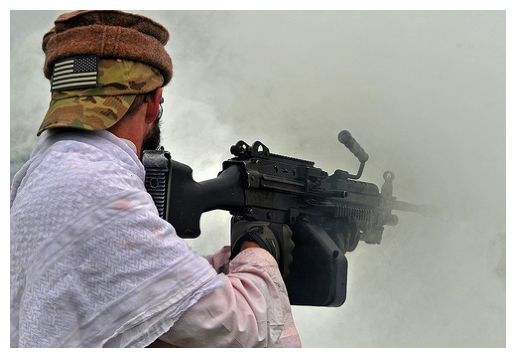

The prediction set is: [np.str_('assault rifle'), np.str_('rifle')]


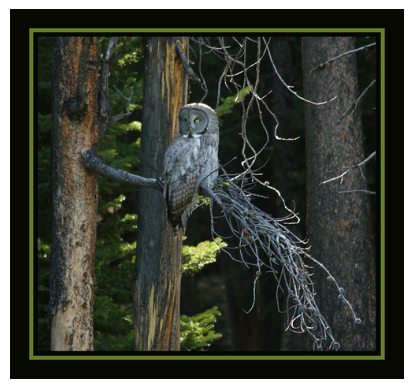

The prediction set is: [np.str_('great grey owl')]


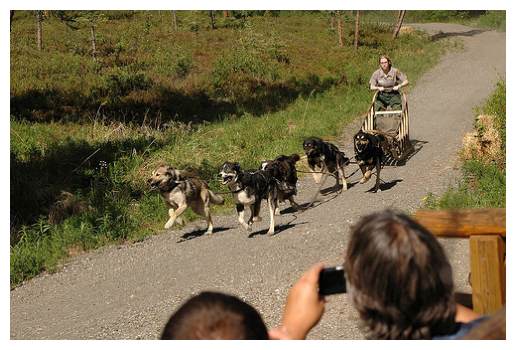

The prediction set is: [np.str_('dog sled')]


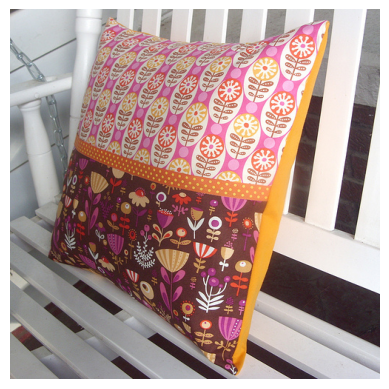

The prediction set is: [np.str_('pillow')]


In [69]:
# Show some examples
with open('../data/imagenet/human_readable_labels.json') as f:
    label_strings = np.array(json.load(f))

example_paths =os.listdir('../data/imagenet/examples')
for i in range(10):
    rand_path = np.random.choice(example_paths)
    img = imread('../data/imagenet/examples/' + rand_path )
    img_index = int(rand_path.split('.')[0])
    # Form the prediction set
    _smx = smx[img_index]
    _pi = np.argsort(_smx)[::-1]
    _srt = np.take_along_axis(_smx,_pi,axis=0)
    _srt_reg = _srt + reg_vec.squeeze()
    _srt_reg_cumsum = _srt_reg.cumsum()
    _ind = (_srt_reg_cumsum - np.random.rand()*_srt_reg) <= qhat if rand else _srt_reg_cumsum - _srt_reg <= qhat
    if disallow_zero_sets: _ind[0] = True
    prediction_set = np.take_along_axis(_ind,_pi.argsort(),axis=0)
    plt.figure()
    plt.imshow(img)
    plt.axis('off')
    plt.show()
    print(f"The prediction set is: {list(label_strings[prediction_set])}")